In [1]:
import torch
import torch.nn as nn
from PIL import Image
from torch.utils.data import Dataset
import numpy as np
import os
torch.manual_seed(0)
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import skimage
import cv2
from skimage import io, color

In [2]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride = 2, use_dropout = False, use_bn = False):
        super(ConvBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size= 4, stride = stride, padding = 1, padding_mode = "reflect")
        self.activation = nn.LeakyReLU(0.2)

        if use_bn == True:
            self.bn = nn.BatchNorm2d(out_channels)
        self.use_bn = use_bn
        if use_dropout == True:
            self.drop = nn.Dropout()
        self.use_dropout = use_dropout

    def forward(self, x):

        x = self.conv(x)
        if self.use_bn:
            x = self.bn(x)
        x = self.activation(x)
        if self.use_dropout:
            x = self.drop(x)
        return x

In [3]:
class Discriminator(nn.Module):
    def __init__(self, in_channels = 3, hidden_channels = 64):
        super(Discriminator, self).__init__()

        self.initial = ConvBlock(in_channels, hidden_channels)

        self.block1 = ConvBlock(hidden_channels, hidden_channels*2, use_bn= True) #64 -> 128
        self.block2 = ConvBlock(hidden_channels*2, hidden_channels*4, use_bn= True) #128 -> 256
        self.block3 = ConvBlock(hidden_channels*4, hidden_channels*8, use_bn= True) #256 -> 512
        self.block4 = ConvBlock(hidden_channels*8, hidden_channels*8, use_bn= True, stride = 1) #512
        #self.block5 = ConvBlock(hidden_channels*8, hidden_channels*8, use_bn= True, stride = 1) 
        #512
        self.final = nn.Conv2d(hidden_channels * 8, 1, kernel_size=1, padding= 1, padding_mode="reflect")
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, x, y):
        x = torch.cat([x, y], axis=1)
        x0 = self.initial(x)
        x1 = self.block1(x0)
        x2 = self.block2(x1)
        x3 = self.block3(x2)
        x4 = self.block4(x3)
        #x5 = self.block5(x4)
        x6 = self.final(x4)
        xn = self.sigmoid(x6)
        return xn

In [4]:
def test():
    x = torch.randn((2,3,256,256))
    y = torch.randn((2,3,256,256))

    model = Discriminator(6)
    pred = model(x,y)
    print(pred.shape)

test()

torch.Size([2, 1, 17, 17])


In [29]:
###Downloading Imagenet#### Not Necessary

import urllib.request
url = 'http://cs231n.stanford.edu/tiny-imagenet-200.zip'
filename = 'image-net.zip'
urllib.request.urlretrieve(url, filename)

KeyboardInterrupt: 

In [37]:
import zipfile
import os
with zipfile.ZipFile("image-net.zip","r") as zip_ref:
        zip_ref.extractall("./images")

In [5]:
class DecodeBlock(nn.Module):
    def __init__(self, in_channels, out_channels, use_dropout=False, use_bn=False, stride = 2):
        super(DecodeBlock, self).__init__()
        self.up = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=4, stride=stride, padding = 1)

        self.activation = nn.ReLU()

        if use_bn == True:
            self.bn = nn.BatchNorm2d(out_channels)
        self.use_bn = use_bn

        if use_dropout == True:
            self.drop = nn.Dropout()
        self.use_dropout = use_dropout

    def forward(self, x):
        x = self.up(x)
        if self.use_bn:
            x = self.bn(x)
        x = self.activation(x)
        if self.use_dropout:
            x = self.drop(x)
        return x


In [6]:
class Generator(nn.Module):
    def __init__(self, in_channels, hidden_channels = 64, out_channels = 2):
        super(Generator, self).__init__()

        self.initial = ConvBlock(in_channels, hidden_channels)
        self.contract1 = ConvBlock(hidden_channels, hidden_channels*2, use_bn=True, use_dropout=False)
        self.contract2 = ConvBlock(hidden_channels*2, hidden_channels*4, use_bn=True, use_dropout=False)
        self.contract3 = ConvBlock(hidden_channels*4, hidden_channels*8, use_bn=True, use_dropout=False)
        self.contract4 = ConvBlock(hidden_channels*8, hidden_channels*8, use_bn=True, use_dropout=False)
        self.contract5 = ConvBlock(hidden_channels*8, hidden_channels*8, use_bn=True, use_dropout=False)
        self.contract6= ConvBlock(hidden_channels*8, hidden_channels*8, use_bn=True, use_dropout=False)
        self.contract7 = ConvBlock(hidden_channels*8, hidden_channels*8, use_bn=False, use_dropout=False)

        hidden_channels = hidden_channels*8
        self.expand1 = DecodeBlock(hidden_channels, hidden_channels, use_dropout=True, use_bn=True)
        self.expand2 = DecodeBlock(hidden_channels*2, hidden_channels, use_dropout=True, use_bn=True)
        self.expand3 = DecodeBlock(hidden_channels*2, hidden_channels, use_dropout=True, use_bn=True)
        self.expand4 = DecodeBlock(hidden_channels*2, hidden_channels, use_dropout=False, use_bn=True)
        self.expand5 = DecodeBlock(hidden_channels*2, hidden_channels//2, use_dropout=False, use_bn=True)
        self.expand6 = DecodeBlock(hidden_channels, hidden_channels//4, use_dropout=False, use_bn=True)
        self.expand7 = DecodeBlock(hidden_channels//2, hidden_channels//8, use_dropout=False, use_bn=True)
        #self.final_up = DecodeBlock(hidden_channels//4, hidden_channels//8, use_dropout=False, use_bn=False, stride  = 2)
        self.final = nn.Sequential(
            nn.ConvTranspose2d(hidden_channels//4, out_channels, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )
    

    def forward(self, x):
        x0 = self.initial(x)
        x1 = self.contract1(x0)
        x2 = self.contract2(x1)
        x3 = self.contract3(x2)
        x4 = self.contract4(x3)
        x5 = self.contract5(x4)
        x6 = self.contract6(x5)
        x7 = self.contract7(x6)
        x8 = self.expand1(x7)
        x9 = self.expand2(torch.cat([x8, x6], axis= 1))
        x10 = self.expand3(torch.cat([x9, x5], axis= 1))
        x11 = self.expand4(torch.cat([x10, x4], axis= 1))
        x12 = self.expand5(torch.cat([x11, x3], axis= 1))
        x13 = self.expand6(torch.cat([x12, x2], axis= 1))
        x14 = self.expand7(torch.cat([x13, x1], axis= 1))
        #x15 = self.final_up(torch.cat([x14, x0], axis= 1))
        return self.final(torch.cat([x14, x0], axis= 1))
    

In [7]:
def test_gen():
    x = torch.randn((2,1,256,256))

    model = Generator(1, out_channels=2)
    pred = model(x)
    print(pred.shape)

test_gen()

torch.Size([2, 2, 256, 256])


In [8]:
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.RandomHorizontalFlip(0.2),
    transforms.RandomVerticalFlip(0.2),
    #transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))
    #transforms.ToTensor(),
])

#import torchvision
#dataset = torchvision.datasets.ImageFolder("./images/tiny-imagenet-200", transform=transform)

In [9]:
class ColorDataset(Dataset):

    def __init__(self, root_dir, transform=None):
        
        self.root_dir = root_dir
        self.list_files = os.listdir(self.root_dir)
        self.transform = transform


    def __len__(self):
        return len(self.list_files)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_file = self.list_files[idx]
        img_path = os.path.join(self.root_dir, img_file)

        sample = Image.open(img_path).convert('RGB')
        if self.transform:
            sample = self.transform(sample)

        sample = np.asarray(sample).reshape(256,256,3)

        lab = (color.rgb2lab(sample) +128)/255
        lab = lab[:,:,1:3].transpose((2,0,1))

        gray = color.rgb2gray(sample)

        sample = torch.from_numpy(lab)
        gray = torch.from_numpy(gray).unsqueeze(0)

        return sample.float(), gray.float()

In [10]:
dataset = ColorDataset("./images/tiny-imagenet-200/test/images", transform=transform)
#./images/tiny-imagenet-200/test/images

In [204]:
for _ in range(5):
    dataloader = DataLoader(dataset, batch_size=1, shuffle=True)
    #train_features = nn.functional.interpolate(next(iter(dataloader)), size=256)
    img, gray = next(iter(dataloader))
    print(f"AB size: {img.size()}")
    print(f"Gray size: {gray.size()}")


(256, 256, 3)
(2, 256, 256)
AB size: torch.Size([1, 2, 256, 256])
Gray size: torch.Size([1, 1, 256, 256])
(256, 256, 3)
(2, 256, 256)
AB size: torch.Size([1, 2, 256, 256])
Gray size: torch.Size([1, 1, 256, 256])
(256, 256, 3)
(2, 256, 256)
AB size: torch.Size([1, 2, 256, 256])
Gray size: torch.Size([1, 1, 256, 256])
(256, 256, 3)
(2, 256, 256)
AB size: torch.Size([1, 2, 256, 256])
Gray size: torch.Size([1, 1, 256, 256])
(256, 256, 3)
(2, 256, 256)
AB size: torch.Size([1, 2, 256, 256])
Gray size: torch.Size([1, 1, 256, 256])


In [60]:
class UnNormalize(object):
    def __init__(self,mean,std):
        self.mean = mean
        self.std = std
        self.to_tensor = transforms.ToTensor()

    def __call__(self, tensor):
        for t,m,s in zip(self.to_tensor(tensor), self.mean, self.std):
            t.mul_(s).add_(m)
        return tensor.numpy().reshape(256,256,3)

In [35]:
dataloader = DataLoader(dataset, batch_size=1, shuffle=True)
unorm = UnNormalize((0.5,0.5,0.5), (0.5,0.5,0.5))
train_features = next(iter(dataloader))
print(train_features[0,0])
print(unorm(train_features)[0,0])

tensor([[198.5624,  -2.9749,  -1.6822,  ...,  -3.9837,  -0.9585, 198.3678],
        [ -3.9837,  -0.9585, 198.3678,  ...,  -1.2444, 195.4954,   1.9936],
        [ -1.0084, 195.5956,   2.3113,  ..., 193.5649,  -0.2982,  -2.9062],
        ...,
        [ 18.7482,  19.7871,  70.4652,  ...,  32.5939,  57.1193,  31.9774],
        [ 31.7289,  54.5814,  32.3253,  ...,  45.3161,  10.3033,  11.7043],
        [ 78.6042,  12.3756,   2.6829,  ...,  18.5678,  18.6252,  62.8829]],
       dtype=torch.float64)
tensor([[ 9.9781e+01, -9.8744e-01, -3.4111e-01,  ..., -1.4918e+00,
          2.0764e-02,  9.9684e+01],
        [-1.4918e+00,  2.0764e-02,  9.9684e+01,  ..., -1.2222e-01,
          9.8248e+01,  1.4968e+00],
        [-4.1844e-03,  9.8298e+01,  1.6556e+00,  ...,  9.7282e+01,
          3.5092e-01, -9.5308e-01],
        ...,
        [ 9.8741e+00,  1.0394e+01,  3.5733e+01,  ...,  1.6797e+01,
          2.9060e+01,  1.6489e+01],
        [ 1.6364e+01,  2.7791e+01,  1.6663e+01,  ...,  2.3158e+01,
          

(256, 256, 3)
(2, 256, 256)
(256, 256, 3)
C:\Users\shiva\AppData\Local\Programs\Python\Python37\lib\site-packages\skimage\color\colorconv.py:1128: UserWarning: Color data out of range: Z < 0 in 22739 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


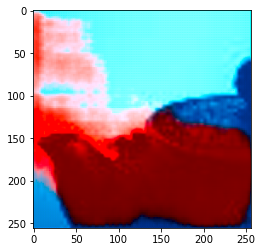

In [228]:
dataloader = DataLoader(dataset, batch_size=1, shuffle=True)
img, gray = next(iter(dataloader))
#print(img.shape)
#print(gray.shape)
fake = gen(gray.to(device))
x = torch.cat((gray[0],fake.detach().cpu()[0]),0).numpy().transpose((1,2,0))
x[:,:,0:1] = x[:, :, 0:1] * 100
x[:, :, 1:3] = x[:, :, 1:3] * 255 - 128 
 
x = color.lab2rgb(x.astype(np.float64))
print(x.shape)
plt.imshow(x)
plt.show()

In [11]:
adv_criterion = nn.BCEWithLogitsLoss() 
recon_criterion = nn.L1Loss() 
lambda_recon = 200

n_epochs = 100
input_dim = 1
output_dim = 2
real_dim = 3
display_step = 200
batch_size = 4
lr = 0.0002
target_shape = 256
device = 'cuda'

In [12]:
gen = Generator(input_dim, real_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator(input_dim + output_dim).to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)

# Feel free to change pretrained to False if you're training the model from scratch
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

In [13]:
def get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon):

    fake = gen(condition)
    fake_disc = disc(fake, condition)
    gen_adv_loss = adv_criterion(fake_disc, torch.ones_like(fake_disc))
    gen_rec_loss = recon_criterion(real, fake)
    gen_loss = gen_adv_loss + lambda_recon * gen_rec_loss

    return gen_loss

  0%|          | 0/2500 [00:00<?, ?it/s]Pretrained initial state


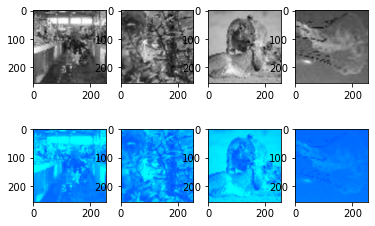

  8%|▊         | 200/2500 [04:50<1:12:02,  1.88s/it]Epoch 0: Step 200: Generator (U-Net) loss: 110.79732376098626, Discriminator loss: 0.7032652238011358


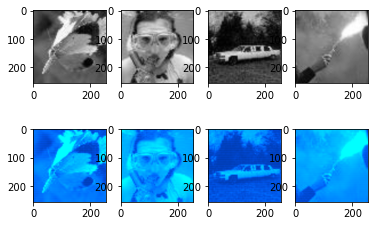

 16%|█▌        | 400/2500 [09:06<47:59,  1.37s/it]Epoch 0: Step 400: Generator (U-Net) loss: 53.15816892147067, Discriminator loss: 0.6276130819320676


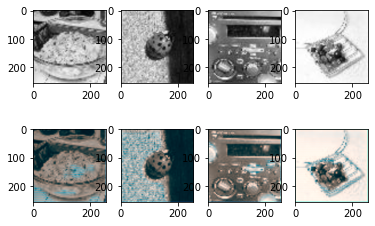

 24%|██▍       | 600/2500 [13:13<35:49,  1.13s/it]Epoch 0: Step 600: Generator (U-Net) loss: 12.241880943775188, Discriminator loss: 0.5791163471341132


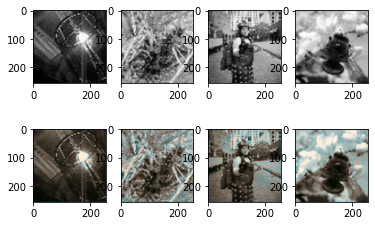

 32%|███▏      | 800/2500 [17:10<33:13,  1.17s/it]Epoch 0: Step 800: Generator (U-Net) loss: 11.157356216907504, Discriminator loss: 0.5475136381387709


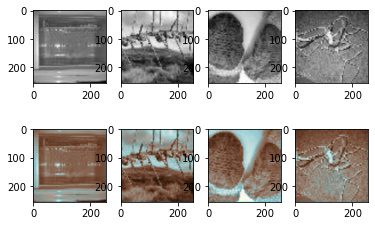

 40%|████      | 1000/2500 [21:10<27:54,  1.12s/it]Epoch 0: Step 1000: Generator (U-Net) loss: 10.682591373920445, Discriminator loss: 0.5323830235004426


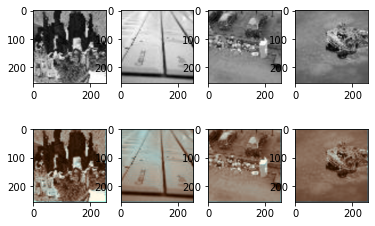

 48%|████▊     | 1200/2500 [25:00<25:16,  1.17s/it]Epoch 0: Step 1200: Generator (U-Net) loss: 10.49196155309677, Discriminator loss: 0.522838341295719


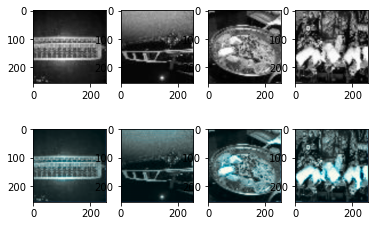

 56%|█████▌    | 1400/2500 [28:52<21:05,  1.15s/it]Epoch 0: Step 1400: Generator (U-Net) loss: 10.444604890346525, Discriminator loss: 0.5176471701264378


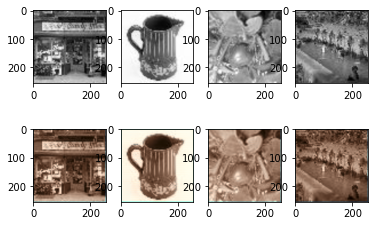

 64%|██████▍   | 1600/2500 [32:53<17:12,  1.15s/it]Epoch 0: Step 1600: Generator (U-Net) loss: 10.28014962911606, Discriminator loss: 0.51729115575552


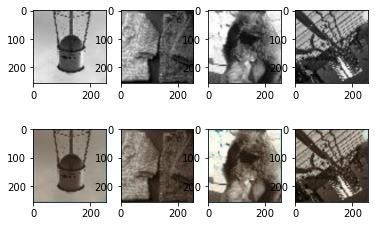

 72%|███████▏  | 1800/2500 [36:50<13:49,  1.18s/it]Epoch 0: Step 1800: Generator (U-Net) loss: 10.11137861967087, Discriminator loss: 0.5135909670591351


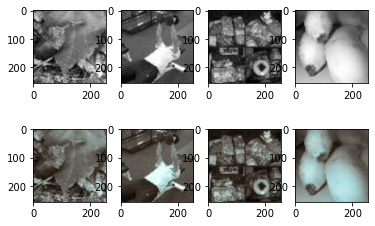

 80%|████████  | 2000/2500 [40:43<09:33,  1.15s/it]Epoch 0: Step 2000: Generator (U-Net) loss: 10.246756448745735, Discriminator loss: 0.5141625654697418


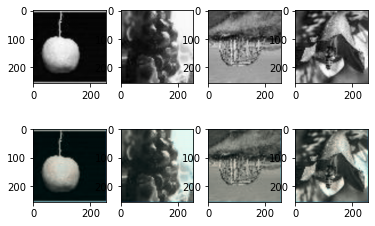

 88%|████████▊ | 2200/2500 [44:36<05:47,  1.16s/it]Epoch 0: Step 2200: Generator (U-Net) loss: 10.368018686771395, Discriminator loss: 0.5130543503165248


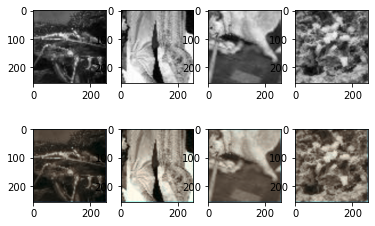

 96%|█████████▌| 2400/2500 [48:29<01:56,  1.16s/it]Epoch 0: Step 2400: Generator (U-Net) loss: 9.731072919368737, Discriminator loss: 0.5088647669553754


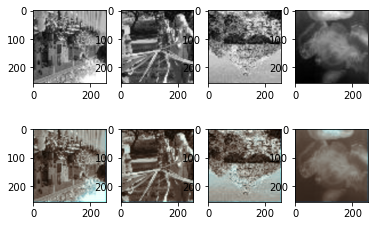

  4%|▍         | 100/2500 [01:50<43:52,  1.10s/it]Epoch 1: Step 2600: Generator (U-Net) loss: 10.019154307842257, Discriminator loss: 0.5089787951111797


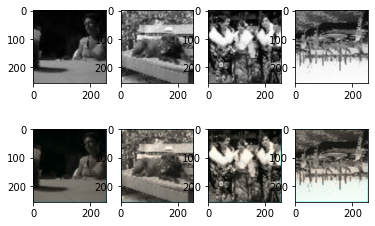

 12%|█▏        | 300/2500 [05:32<40:14,  1.10s/it]Epoch 1: Step 2800: Generator (U-Net) loss: 9.778222439289092, Discriminator loss: 0.5087923955917357


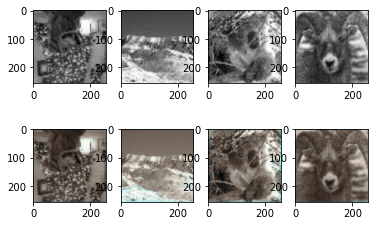

 20%|██        | 500/2500 [09:08<35:56,  1.08s/it]Epoch 1: Step 3000: Generator (U-Net) loss: 9.97200118303299, Discriminator loss: 0.5099454668164254


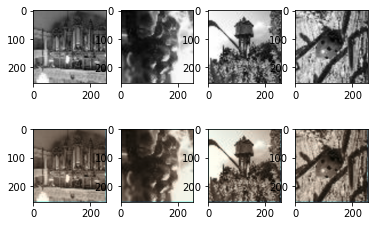

 28%|██▊       | 700/2500 [12:44<32:00,  1.07s/it]Epoch 1: Step 3200: Generator (U-Net) loss: 9.920189599990847, Discriminator loss: 0.5092393249273298


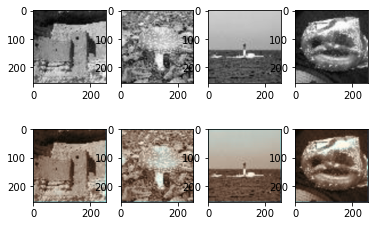

 36%|███▌      | 900/2500 [16:22<29:26,  1.10s/it]Epoch 1: Step 3400: Generator (U-Net) loss: 9.825727305412292, Discriminator loss: 0.5082583394646647


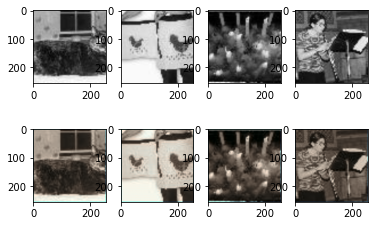

 44%|████▍     | 1100/2500 [19:59<24:52,  1.07s/it]Epoch 1: Step 3600: Generator (U-Net) loss: 9.818612072467806, Discriminator loss: 0.5097700959444045


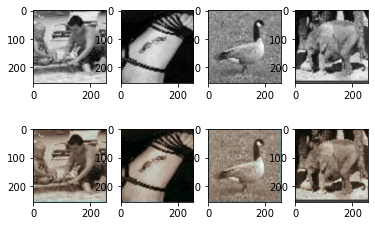

 52%|█████▏    | 1300/2500 [23:37<21:27,  1.07s/it]Epoch 1: Step 3800: Generator (U-Net) loss: 9.462788116931916, Discriminator loss: 0.5072295448184014


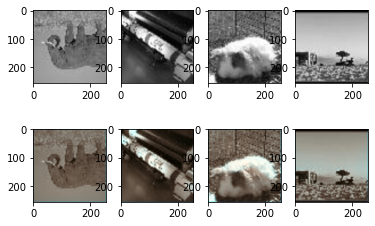

 60%|██████    | 1500/2500 [27:13<17:51,  1.07s/it]Epoch 1: Step 4000: Generator (U-Net) loss: 9.421369066238407, Discriminator loss: 0.5078933230042461


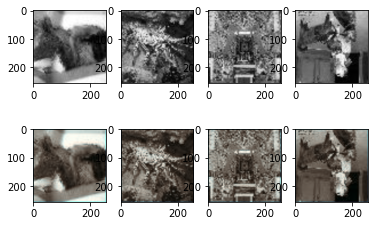

 68%|██████▊   | 1700/2500 [30:50<14:22,  1.08s/it]Epoch 1: Step 4200: Generator (U-Net) loss: 9.577277312278747, Discriminator loss: 0.5075046864151953


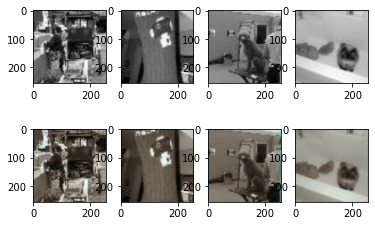

 76%|███████▌  | 1900/2500 [34:29<11:07,  1.11s/it]Epoch 1: Step 4400: Generator (U-Net) loss: 9.566174736022953, Discriminator loss: 0.5077473932504654


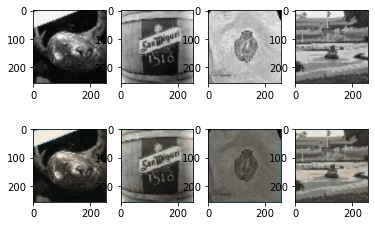

 84%|████████▍ | 2100/2500 [38:11<07:18,  1.10s/it]Epoch 1: Step 4600: Generator (U-Net) loss: 9.528578310012817, Discriminator loss: 0.5085453596711155


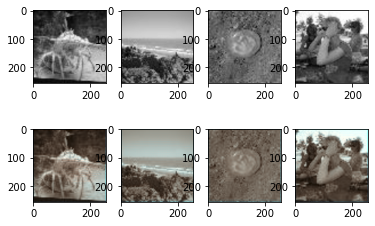

 92%|█████████▏| 2300/2500 [41:49<03:36,  1.08s/it]Epoch 1: Step 4800: Generator (U-Net) loss: 9.554567451477052, Discriminator loss: 0.5083266672492028


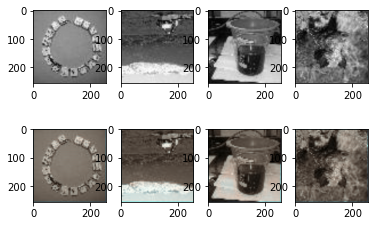

  0%|          | 0/2500 [00:00<?, ?it/s]Epoch 2: Step 5000: Generator (U-Net) loss: 9.497535648345949, Discriminator loss: 0.5073275014758111


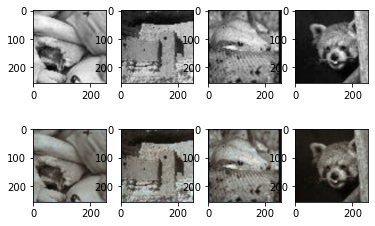

  8%|▊         | 200/2500 [03:39<42:21,  1.10s/it]Epoch 2: Step 5200: Generator (U-Net) loss: 9.306336131095883, Discriminator loss: 0.5071445915102962


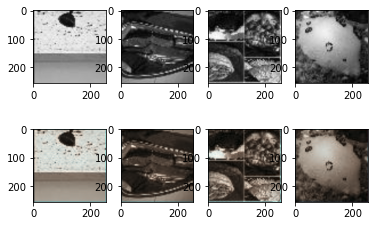

 16%|█▌        | 400/2500 [07:18<37:55,  1.08s/it]Epoch 2: Step 5400: Generator (U-Net) loss: 9.281921002864834, Discriminator loss: 0.5056647130846978


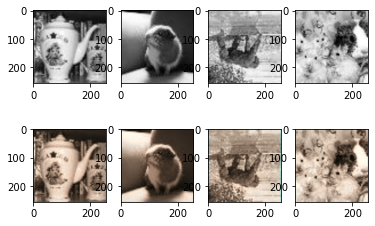

 24%|██▍       | 600/2500 [10:57<34:48,  1.10s/it]Epoch 2: Step 5600: Generator (U-Net) loss: 9.08177633047104, Discriminator loss: 0.5050916808843614


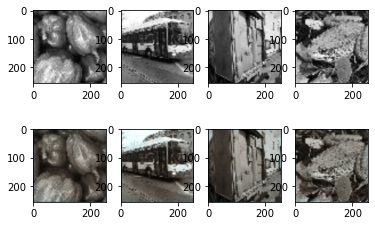

 32%|███▏      | 800/2500 [14:35<30:50,  1.09s/it]Epoch 2: Step 5800: Generator (U-Net) loss: 9.324613792896267, Discriminator loss: 0.5063688868284225


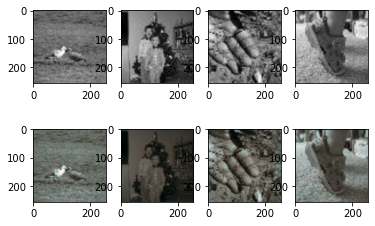

 40%|████      | 1000/2500 [18:14<27:31,  1.10s/it]Epoch 2: Step 6000: Generator (U-Net) loss: 9.108668513298035, Discriminator loss: 0.5050055608153347


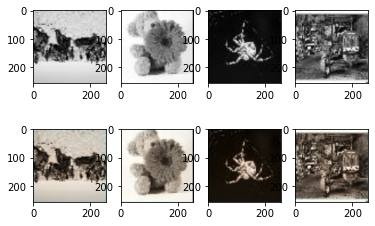

 48%|████▊     | 1200/2500 [21:54<23:32,  1.09s/it]Epoch 2: Step 6200: Generator (U-Net) loss: 9.260459940433497, Discriminator loss: 0.5041860029101373
C:\Users\shiva\AppData\Local\Programs\Python\Python37\lib\site-packages\skimage\color\colorconv.py:1128: UserWarning: Color data out of range: Z < 0 in 1 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


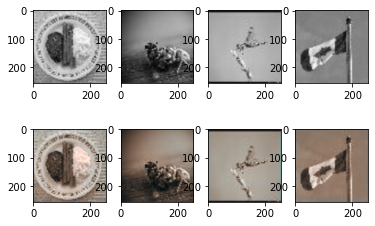

 56%|█████▌    | 1400/2500 [25:33<19:38,  1.07s/it]Epoch 2: Step 6400: Generator (U-Net) loss: 9.41530614614486, Discriminator loss: 0.5039570426940918


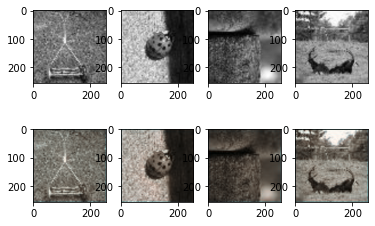

 64%|██████▍   | 1600/2500 [29:13<16:07,  1.07s/it]Epoch 2: Step 6600: Generator (U-Net) loss: 8.919723393917085, Discriminator loss: 0.5043480402231217


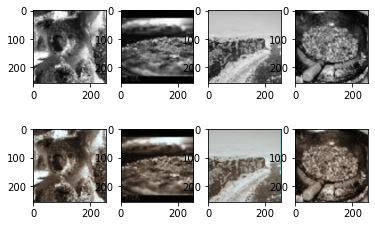

 72%|███████▏  | 1800/2500 [32:54<12:50,  1.10s/it]Epoch 2: Step 6800: Generator (U-Net) loss: 9.132068741321566, Discriminator loss: 0.503607406914234


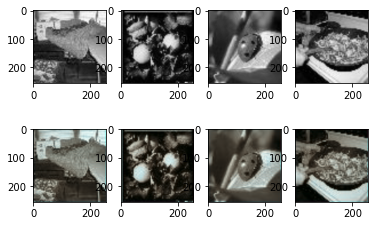

 80%|████████  | 2000/2500 [36:30<08:55,  1.07s/it]Epoch 2: Step 7000: Generator (U-Net) loss: 9.306788737773891, Discriminator loss: 0.503417031764984


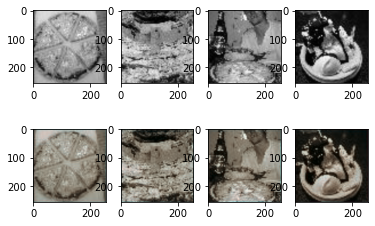

 88%|████████▊ | 2200/2500 [40:06<05:23,  1.08s/it]Epoch 2: Step 7200: Generator (U-Net) loss: 8.853574349880217, Discriminator loss: 0.5035077780485151


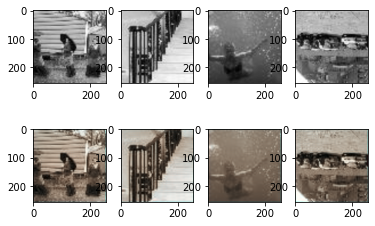

 96%|█████████▌| 2400/2500 [43:44<01:48,  1.08s/it]Epoch 2: Step 7400: Generator (U-Net) loss: 8.895167684555055, Discriminator loss: 0.5033673411607742


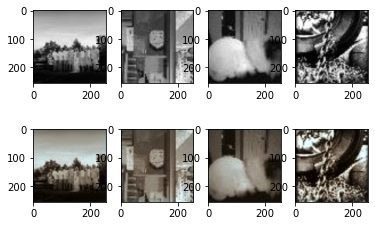

  4%|▍         | 100/2500 [01:47<42:46,  1.07s/it]Epoch 3: Step 7600: Generator (U-Net) loss: 8.812512795925139, Discriminator loss: 0.5033299270272257


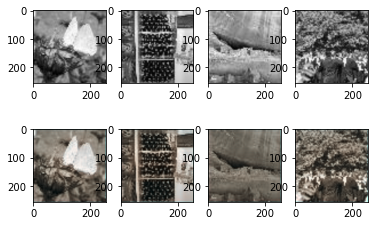

 12%|█▏        | 300/2500 [05:23<39:05,  1.07s/it]Epoch 3: Step 7800: Generator (U-Net) loss: 8.897210407257077, Discriminator loss: 0.5033782204985618
C:\Users\shiva\AppData\Local\Programs\Python\Python37\lib\site-packages\skimage\color\colorconv.py:1128: UserWarning: Color data out of range: Z < 0 in 2 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


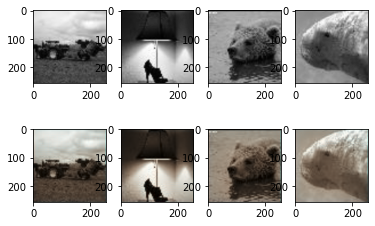

 20%|██        | 500/2500 [09:00<35:52,  1.08s/it]Epoch 3: Step 8000: Generator (U-Net) loss: 8.977604346275326, Discriminator loss: 0.5033177495002751


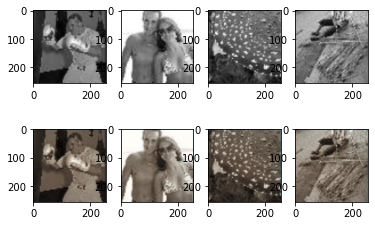

 28%|██▊       | 700/2500 [12:46<32:08,  1.07s/it]Epoch 3: Step 8200: Generator (U-Net) loss: 8.90668160319328, Discriminator loss: 0.5033184942603113


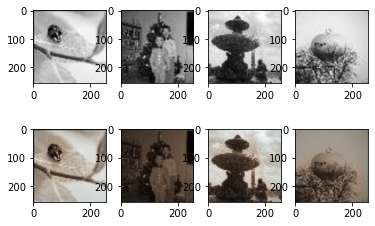

 36%|███▌      | 900/2500 [16:44<36:57,  1.39s/it]Epoch 3: Step 8400: Generator (U-Net) loss: 8.70278339147568, Discriminator loss: 0.5032806327939033


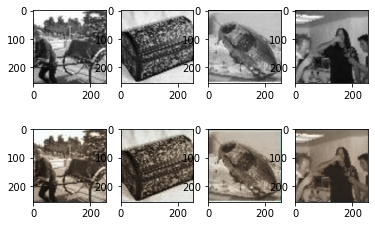

 44%|████▍     | 1100/2500 [20:49<26:57,  1.16s/it]Epoch 3: Step 8600: Generator (U-Net) loss: 8.859722058773045, Discriminator loss: 0.5033271518349647


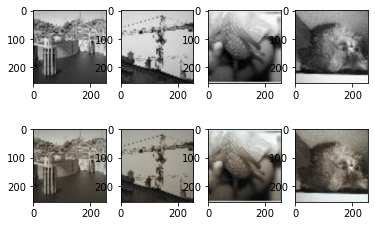

 52%|█████▏    | 1300/2500 [24:54<24:37,  1.23s/it]Epoch 3: Step 8800: Generator (U-Net) loss: 9.055197055339812, Discriminator loss: 0.5037770208716391


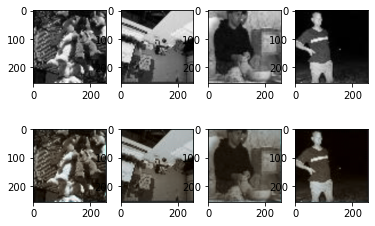

 60%|██████    | 1500/2500 [29:04<21:06,  1.27s/it]Epoch 3: Step 9000: Generator (U-Net) loss: 8.919299941062928, Discriminator loss: 0.5034635078907014


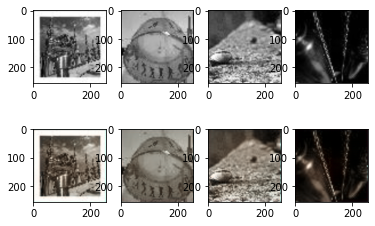

 68%|██████▊   | 1700/2500 [33:14<16:55,  1.27s/it]Epoch 3: Step 9200: Generator (U-Net) loss: 9.36744715452194, Discriminator loss: 0.5032852321863174


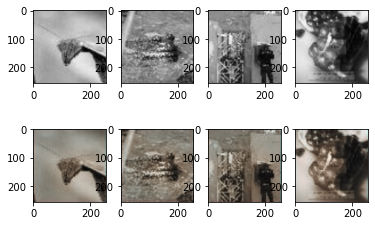

 76%|███████▌  | 1900/2500 [37:12<11:35,  1.16s/it]Epoch 3: Step 9400: Generator (U-Net) loss: 8.671734538078306, Discriminator loss: 0.5043703979253767


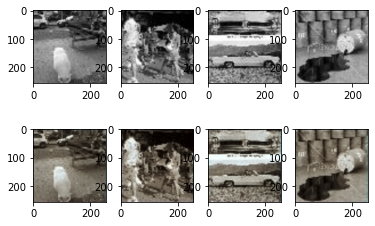

 84%|████████▍ | 2100/2500 [41:05<07:39,  1.15s/it]Epoch 3: Step 9600: Generator (U-Net) loss: 8.718576512336735, Discriminator loss: 0.5034804305434227


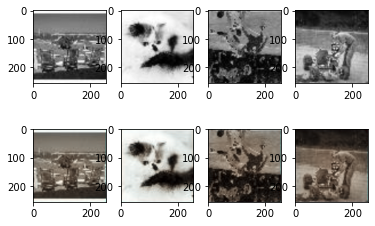

 92%|█████████▏| 2300/2500 [45:02<03:56,  1.18s/it]Epoch 3: Step 9800: Generator (U-Net) loss: 8.61750665903091, Discriminator loss: 0.5032873138785365


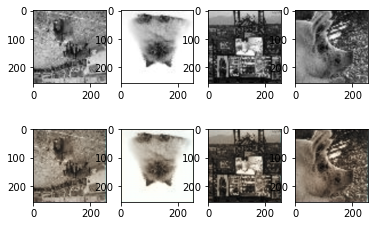

  0%|          | 0/2500 [00:00<?, ?it/s]Epoch 4: Step 10000: Generator (U-Net) loss: 8.711812853813166, Discriminator loss: 0.5032668772339821


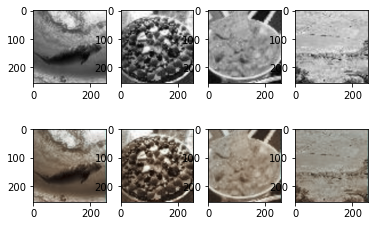

  8%|▊         | 200/2500 [03:55<44:29,  1.16s/it]Epoch 4: Step 10200: Generator (U-Net) loss: 8.617865843772885, Discriminator loss: 0.5032412752509118


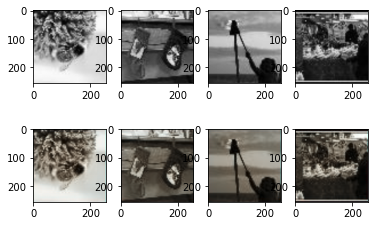

 16%|█▌        | 400/2500 [07:50<40:38,  1.16s/it]Epoch 4: Step 10400: Generator (U-Net) loss: 8.524596047401431, Discriminator loss: 0.5032373788952827


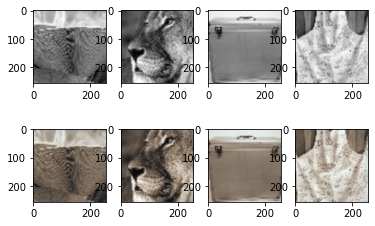

 18%|█▊        | 457/2500 [09:02<40:23,  1.19s/it]


KeyboardInterrupt: 

In [14]:
#from skimage import color
import numpy as np

def train(save_model=False):
    mean_generator_loss = 0
    mean_discriminator_loss = 0
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    cur_step = 0

    for epoch in range(n_epochs):
        # Dataloader returns the batches
        for ab, gray in tqdm(dataloader):
            cur_batch_size = len(gray)
            condition = gray.to(device)
            real = ab.to(device)

            ### Update discriminator ###
            disc_opt.zero_grad() # Zero out the gradient before backpropagation
            with torch.no_grad():
                fake = gen(condition)
            disc_fake_hat = disc(fake.detach(), condition) # Detach generator
            disc_fake_loss = adv_criterion(disc_fake_hat, torch.zeros_like(disc_fake_hat))
            disc_real_hat = disc(real, condition)
            disc_real_loss = adv_criterion(disc_real_hat, torch.ones_like(disc_real_hat))
            disc_loss = (disc_fake_loss + disc_real_loss) / 2
            disc_loss.backward(retain_graph=True) # Update gradients
            disc_opt.step() # Update optimizer

            ### Update generator ###
            gen_opt.zero_grad()
            gen_loss = get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon)
            gen_loss.backward() # Update gradients
            gen_opt.step() # Update optimizer

            # Keep track of the average discriminator loss
            mean_discriminator_loss += disc_loss.item() / display_step
            # Keep track of the average generator loss
            mean_generator_loss += gen_loss.item() / display_step

            ### Visualization code ###
            if cur_step % display_step == 0:
                if cur_step > 0:
                    print(f"Epoch {epoch}: Step {cur_step}: Generator (U-Net) loss: {mean_generator_loss}, Discriminator loss: {mean_discriminator_loss}")
                else:
                    print("Pretrained initial state")
                
                f, axrr = plt.subplots(2, batch_size)
                for i in range(2):
                    for j in range(batch_size):
                        x = torch.cat((gray[j],fake.detach().cpu()[j]),0).numpy().transpose((1,2,0))
                        x[:,:,0:1] = x[:, :, 0:1] * 100
                        x[:, :, 1:3] = x[:, :, 1:3] * 255 - 128

                        if i == 0:
                            axrr[i,j].imshow(gray.squeeze().numpy()[j], cmap = "gray")
                        else:
                            axrr[i,j].imshow(color.lab2rgb(x.astype(np.float64)))
                plt.show()
                mean_generator_loss = 0
                mean_discriminator_loss = 0
                # You can change save_model to True if you'd like to save the model
                if save_model:
                    torch.save({'gen': gen.state_dict(),
                        'gen_opt': gen_opt.state_dict(),
                        'disc': disc.state_dict(),
                        'disc_opt': disc_opt.state_dict()
                    }, f"pix2pix_{cur_step}.pth")
            cur_step += 1
train()